In [3]:
import numpy as np
import matplotlib.pyplot as plt
import healpy as hp
from astropy.io import fits
from astropy.utils.data import get_pkg_data_filename
import functions as f
%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format ='retina'

#### Importing the Planck15 Raw CMB data from https://irsa.ipac.caltech.edu/data/Planck/release_2/all-sky-maps/

In [4]:
CMB_map_names = ["LFI_SkyMap_030_1024_R2.01_full.fits",
                 "LFI_SkyMap_044_1024_R2.01_full.fits" ,
                 "LFI_SkyMap_070_1024_R2.01_full.fits",
                 "HFI_SkyMap_100_2048_R2.02_full.fits", 
                 "HFI_SkyMap_143_2048_R2.02_full.fits",
                 "HFI_SkyMap_217_2048_R2.02_full.fits", 
                 "HFI_SkyMap_353_2048_R2.02_full.fits", 
                 "HFI_SkyMap_545_2048_R2.02_full.fits", 
                 "HFI_SkyMap_857_2048_R2.02_full.fits",];

In [5]:
CMB_maps = []
for i in CMB_map_names:
    
    temp = hp.read_map("../CMB_maps/%s"%(i))
    temp2 = hp.pixelfunc.ud_grade(temp, 512, order_in='RING') #to have the same resolution for all maps
    CMB_maps.append(temp2)

/Users/anahoban/anaconda3/lib/python3.7/site-packages/healpy/fitsfunc.py:352: UserWarning: If you are not specifying the input dtype and using the default np.float64 dtype of read_map(), please consider that it will change in a future version to None as to keep the same dtype of the input file: please explicitly set the dtype if it is important to you.
  "If you are not specifying the input dtype and using the default "


NSIDE = 1024
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING


/Users/anahoban/anaconda3/lib/python3.7/site-packages/healpy/fitsfunc.py:352: UserWarning: If you are not specifying the input dtype and using the default np.float64 dtype of read_map(), please consider that it will change in a future version to None as to keep the same dtype of the input file: please explicitly set the dtype if it is important to you.
  "If you are not specifying the input dtype and using the default "


NSIDE = 1024
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING
NSIDE = 1024
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING
NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT


/Users/anahoban/anaconda3/lib/python3.7/site-packages/healpy/fitsfunc.py:403: UserWarning: No INDXSCHM keyword in header file : assume IMPLICIT
  warnings.warn("No INDXSCHM keyword in header file : " "assume {}".format(schm))


Ordering converted to RING
NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING
NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING
NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING
NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING
NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING


#### Raw data maps for all 9 frequencies


0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
0.0 180.0 -180.0 180.0
The inter

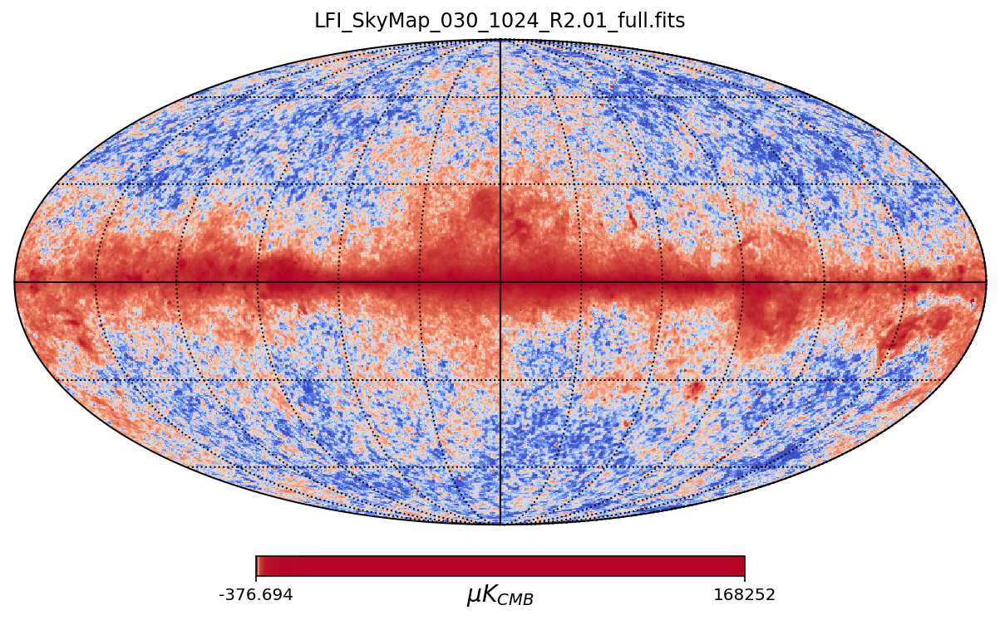

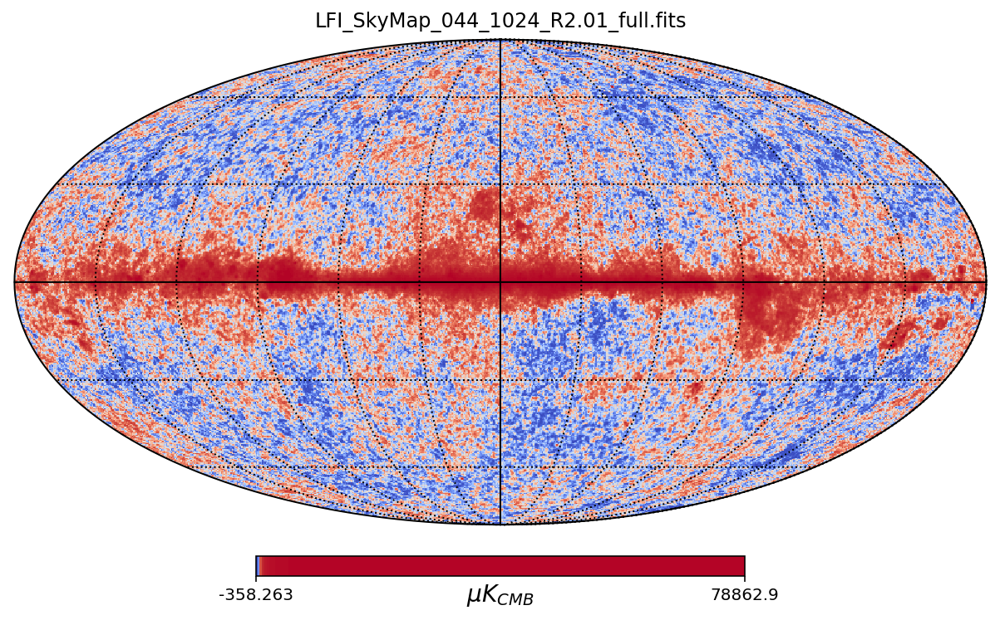

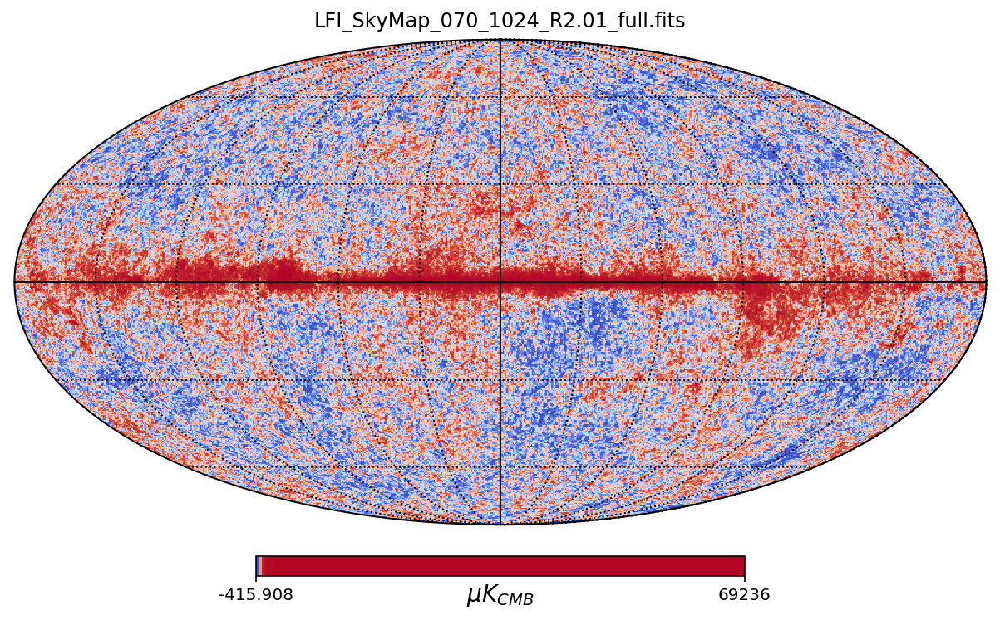

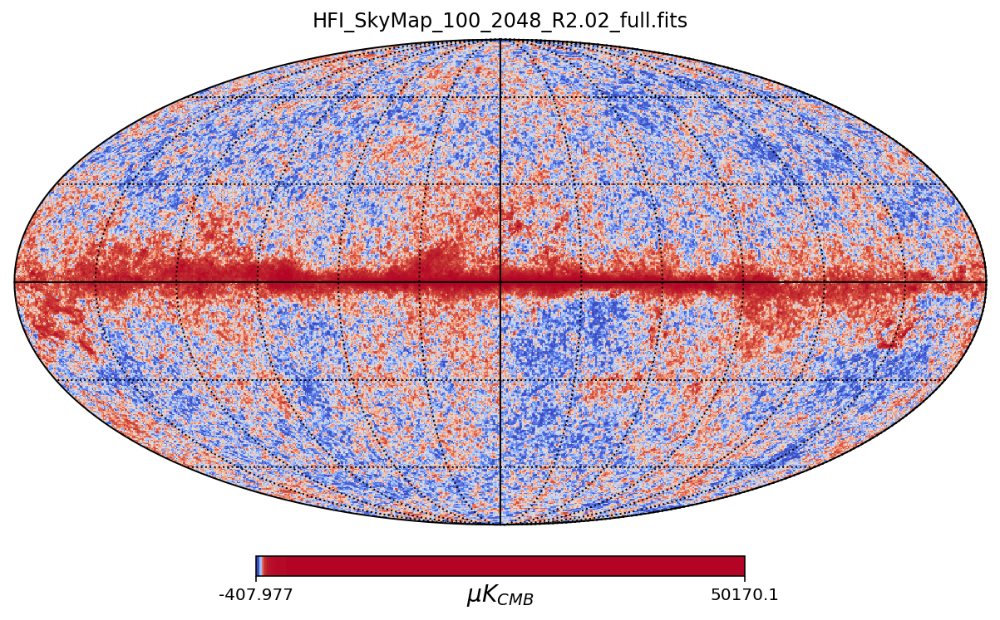

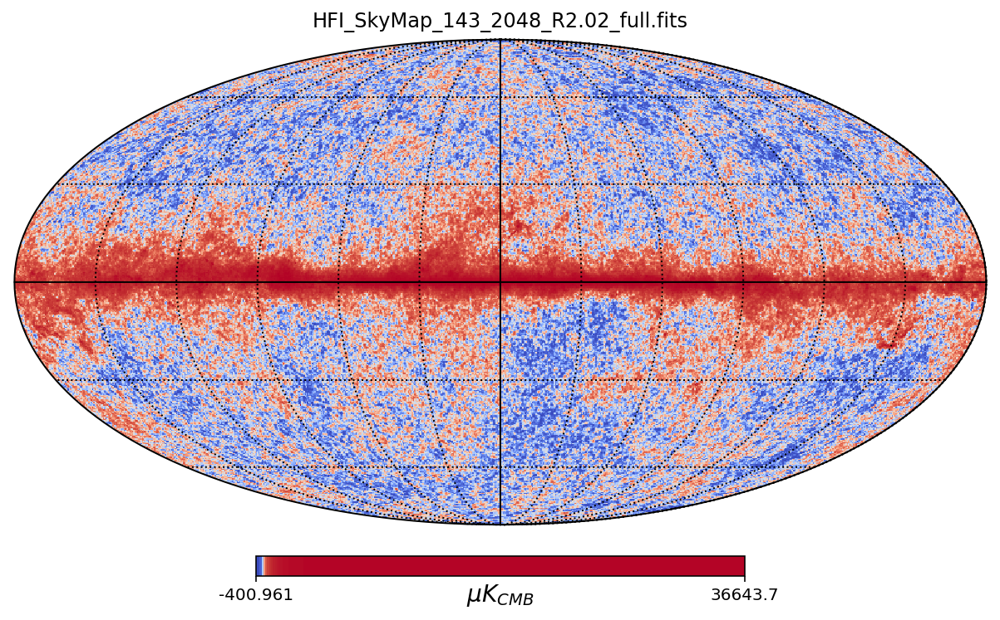

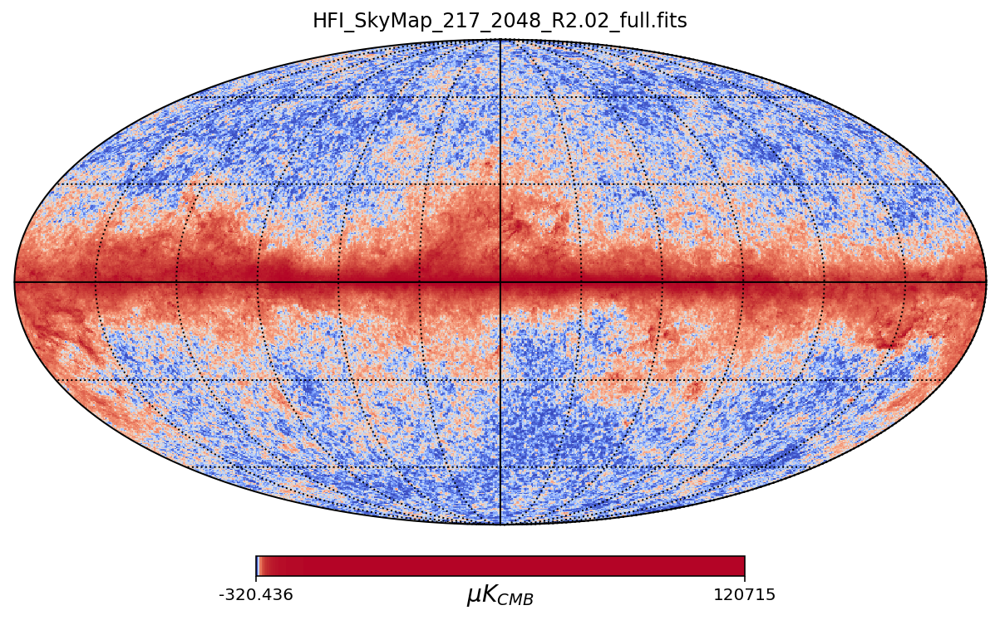

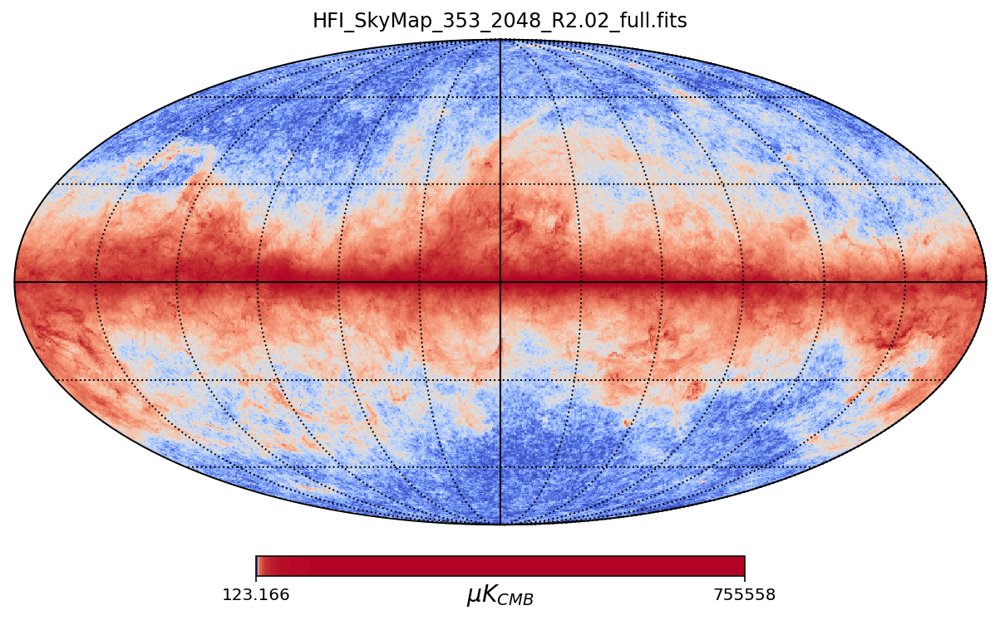

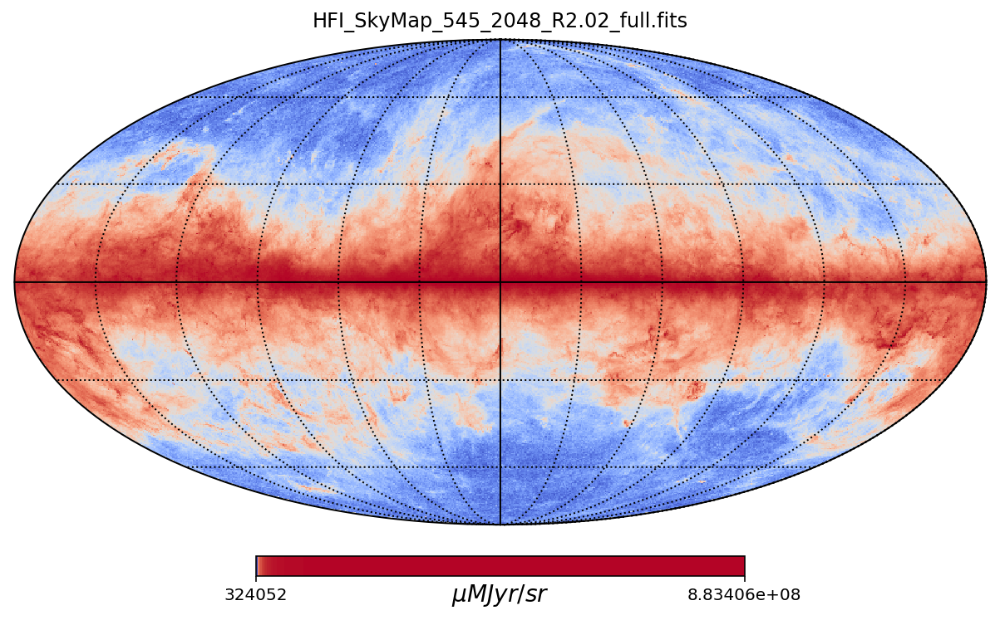

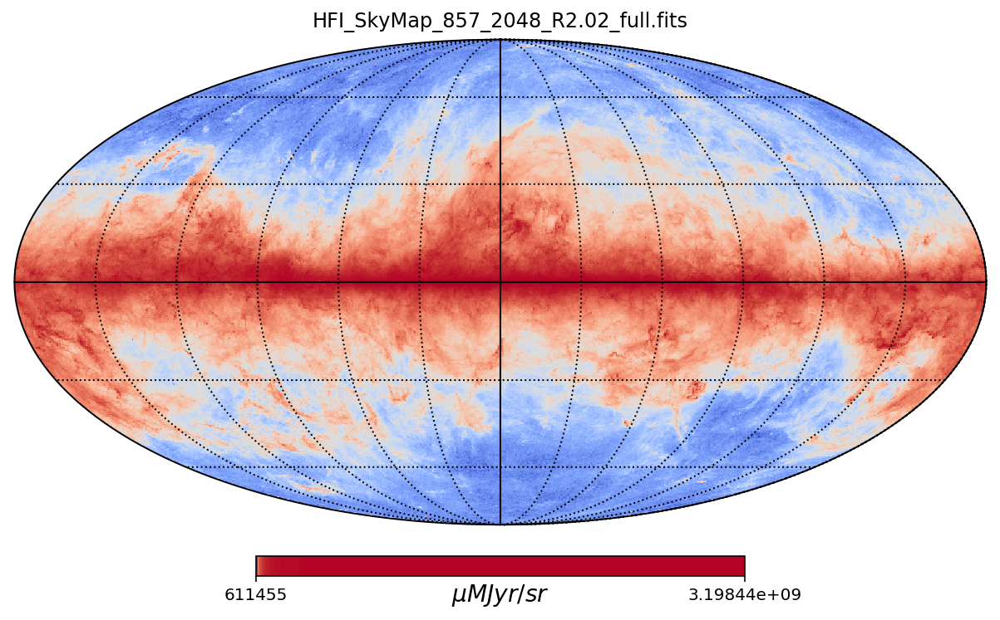

In [6]:
u = r"$\mu K_{CMB}$"
u2 = r"$\mu MJyr/sr$"
for i in range(len(CMB_maps)):
    if i < 7 :
        hp.mollview( (10**6)*CMB_maps[i], unit= u ,norm="hist", title=CMB_map_names[i], cmap = 'coolwarm'
                 #min=-1,
                 #max=1,
                 )
    else: 
        hp.mollview( (10**6)*CMB_maps[i], unit= u2 ,norm="hist", title=CMB_map_names[i], cmap = 'coolwarm'
                 #min=-1,
                 #max=1,
                 )
        
    hp.graticule()


## Data Analysis
#### First, a few important things:
the signal is given in different units depending on the band : "The signal is given in units of Kcmb for 30-353 GHz, or MJy/sr (for a constant νFν energy distribution ) for 545 and 857 GHz." Hence we need to convert the 2 highest bands to the units $K_{cmb}$.

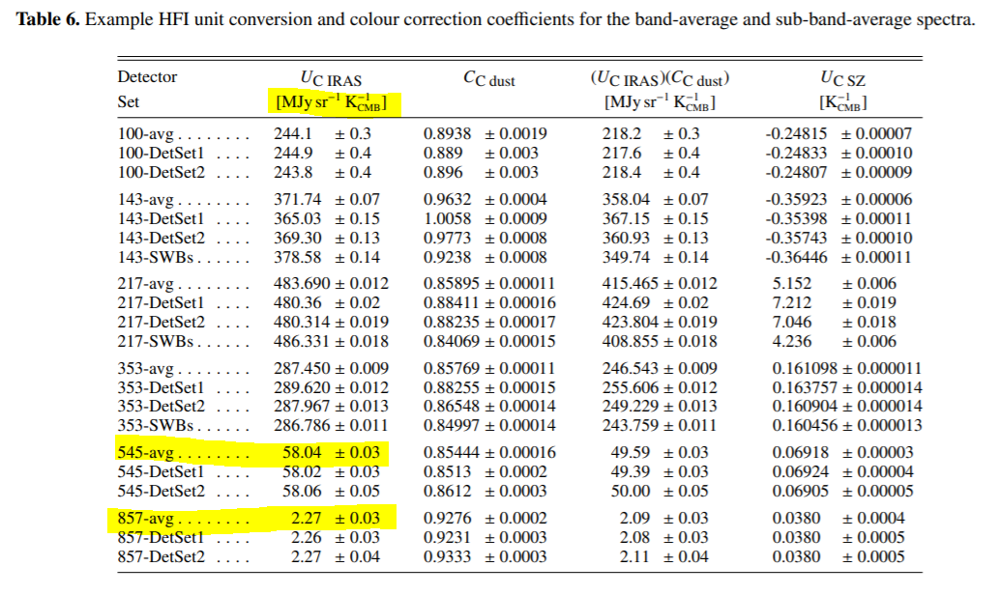

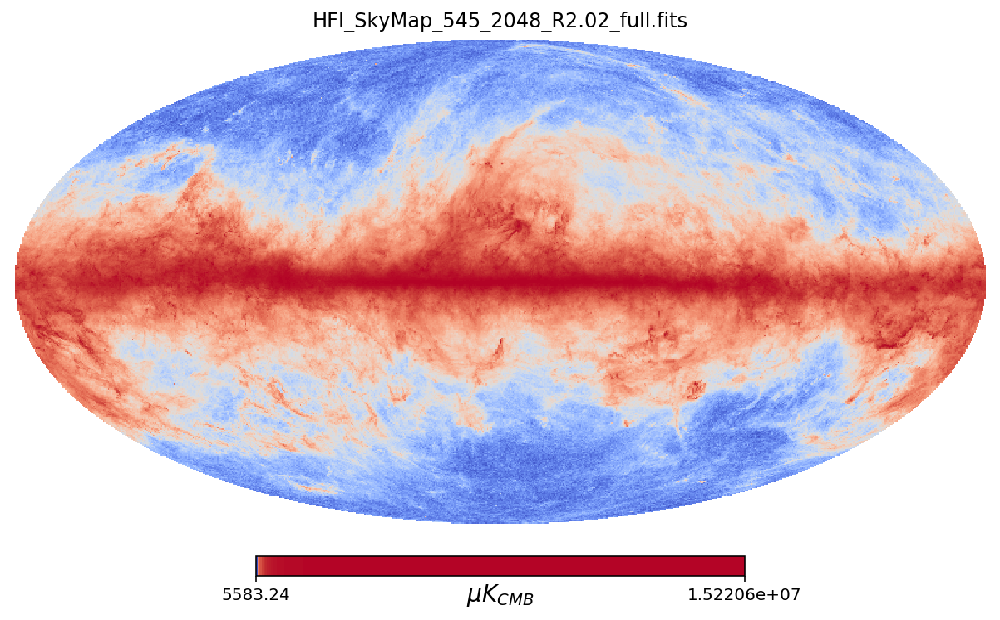

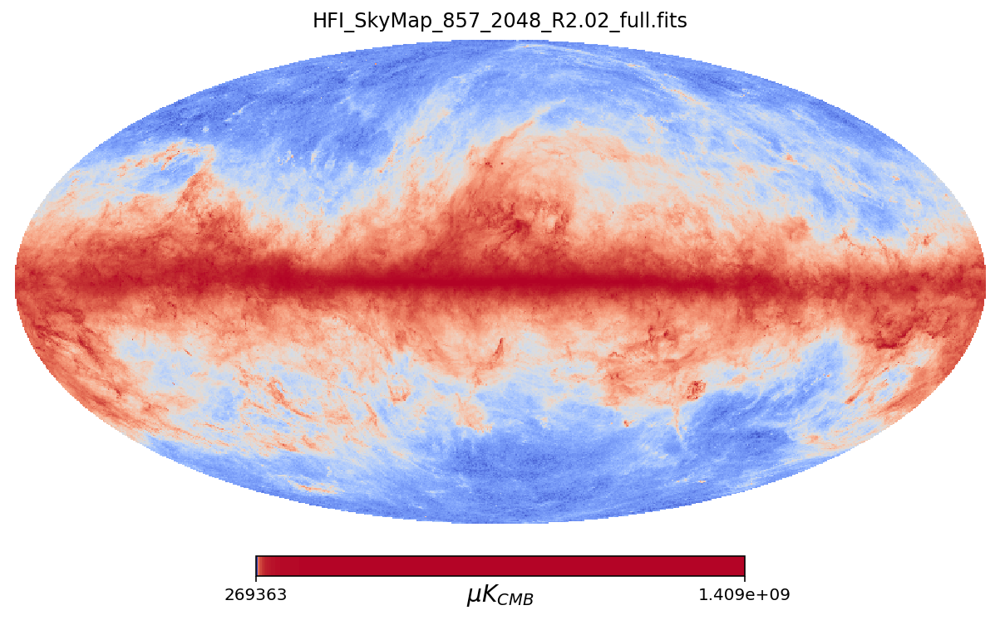

In [7]:
# the diff frequencies
freq = [30,44,70,100,143,217,353,545,857]

#the HFI where not obtained in the same units as the LFI, there exist some conversion factors:
conv_factors = [1/58.04,1/2.27]

CMB_maps_cor =[]
for i in range(2):
    #convert
    CMB_maps_cor.append(conv_factors[i]*CMB_maps[7+i])

    #visualize
    hp.mollview( (10**6)*CMB_maps_cor[i], unit= u ,norm="hist", title=CMB_map_names[i+7], cmap = 'coolwarm'
                 #min=-1,
                 #max=1,
                 )


In [8]:
#step 1
%autoreload 2
CMB_maps[7] = CMB_maps_cor[0]
CMB_maps[8] = CMB_maps_cor[1]

diff_maps = []
for i in range(len(CMB_maps)-1):
    diff_maps.append(CMB_maps[i]-CMB_maps[1+i])
    
#step 2
abs_diff_maps = np.abs(np.transpose(diff_maps))
junk_map = np.array([np.max(i) for i in abs_diff_maps])

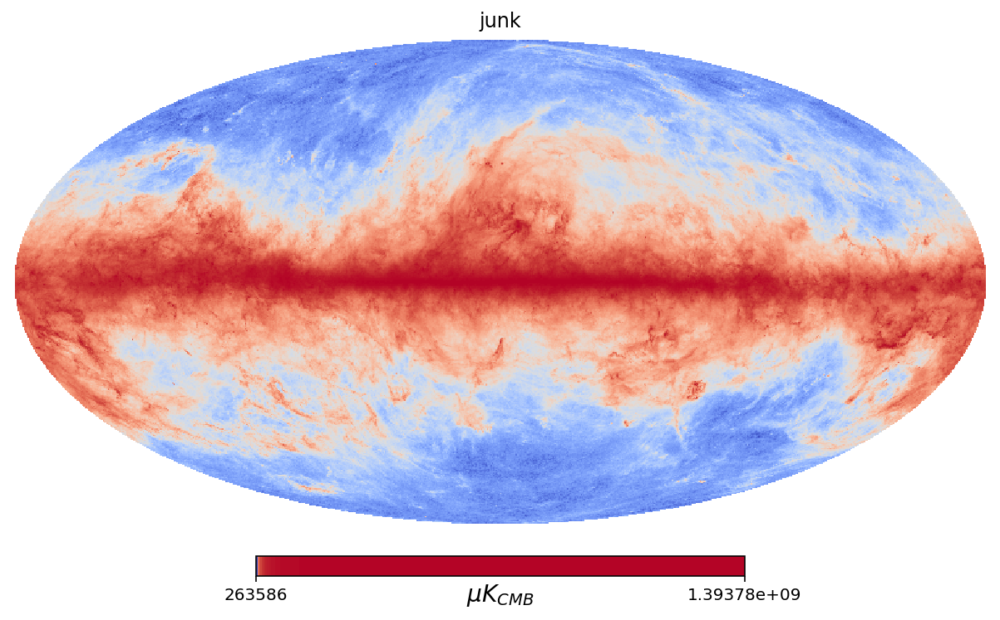

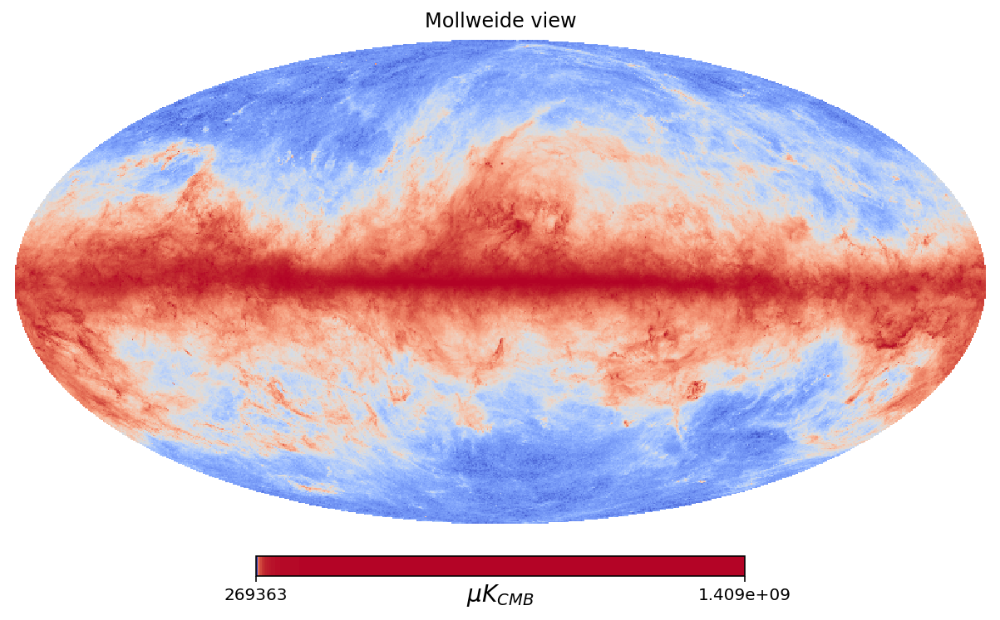

In [9]:
#comparing junk map to 800-band map
hp.mollview( (10**6)*junk_map, unit= u ,norm="hist", title='junk', cmap = 'coolwarm'
                 #min=-1,
                 #max=1,
                 )
hp.mollview( (10**6)*CMB_maps_cor[1]-junk_map, unit= u ,norm="hist", cmap = 'coolwarm'
                 #min=-1,
                 #max=1,
                 )

### Region Finding (based on junk map)

the bin edges aka regions [2.53674752e-01 6.76377932e-01 1.80343966e+00 4.80854628e+00
 1.28211206e+01 3.41852036e+01 9.11486743e+01 2.43031486e+02
 6.47999584e+02 1.72777391e+03 4.60679724e+03]


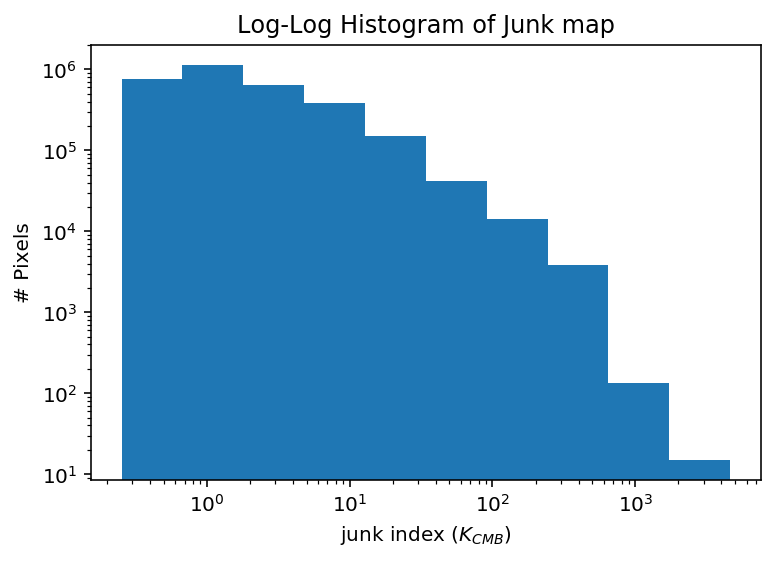

In [36]:
#finding the edges of our hist
number_bins = 11
low_edge = np.min(junk_map)
high_edge = np.max(junk_map)
log_bins = np.logspace(np.log10(low_edge),np.log10(high_edge), number_bins)

#plotting a log hist to find the regions
plt.hist(junk_map, bins=log_bins,log=True);
plt.title('Log-Log Histogram of Junk map')
plt.semilogx()
plt.xlabel('junk index ($K_{CMB}$)')
plt.ylabel('# Pixels')
print('the bin edges aka regions',log_bins)

In [73]:
#regions fof the boolean mask making code
regions = f.bins_to_regions(log_bins)


In [63]:
#splitting boolean map created from junk map
boolean_template, cut_junk_map = f.splitting_step1(regions,junk_map)

In [67]:
#cutting all maps
cuts = []

for i in range(len(CMB_maps)):
    cuts.append(f.splitting_step2(boolean_template, CMB_maps[i]))